# Segment syllables within identified bouts and assign syllable IDs by clustering

Testing parameters for zebra finch song

*Could pad bouts that have bad segmentation? I think the issue might be not enough silence*

In [1]:
%matplotlib inline

import os
import logging
import socket
import pickle
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats
from scipy import signal
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from joblib import Parallel,delayed
import datetime
import copy
import sys

sys.path.append('/mnt/cube/lo/envs/ceciestunepipe')
# sys.path.append('/mnt/cube/tsmcpher/code/')
from ceciestunepipe.file import bcistructure as et
from ceciestunepipe.util.sound import boutsearch as bs
from ceciestunepipe.pipeline import searchbout as sb
from ceciestunepipe.util import wavutil as wu
from ceciestunepipe.util.sound import spectral as sp
from importlib import reload

sys.path.append('/mnt/cube/lo/envs/vocalization-segmentation') ### update to vocalseg env in /mnt/cube/chronic_ephys
from vocalseg.dynamic_thresholding import dynamic_threshold_segmentation, plot_segmented_spec, plot_segmentations

sys.path.append('/mnt/cube/lo/envs/avgn_paper') ### update to avgn env in /mnt/cube/chronic_ephys
from avgn.signalprocessing.filtering import butter_bandpass_filter
from avgn.utils.hparams import HParams
from avgn.signalprocessing.filtering import prepare_mel_matrix
from avgn.signalprocessing.create_spectrogram_dataset import make_spec, mask_spec, log_resize_spec, pad_spectrogram, flatten_spectrograms
from avgn.visualization.spectrogram import draw_spec_set
from avgn.visualization.quickplots import draw_projection_plots
from avgn.visualization.projections import scatter_spec

import umap
import hdbscan

In [2]:
def norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))

### Set sess_par variables below:

In [3]:
# Example of one that works well
filepath = '/mnt/sphere/speech_bci/derived_data/z_c8b5_23/2023-03-30/bout_detection_threshold'

wavfiles = ['2023-03-30_POI16.wav', \
            '2023-03-30_POI38.wav', \
            '2023-03-30_POI88.wav', \
            '2023-03-30_POI107.wav', \
            '2023-03-30_POI113.wav', \
            '2023-03-30_POI134.wav', \
            '2023-03-30_POI138.wav', \
            '2023-03-30_POI142.wav', \
            '2023-03-30_POI201.wav', \
            '2023-03-30_POI214.wav', \
            '2023-03-30_POI220.wav', \
            '2023-03-30_POI244.wav', \
            '2023-03-30_POI272.wav', \
            '2023-03-30_POI276.wav', \
            '2023-03-30_POI300.wav', \
            '2023-03-30_POI360.wav', \
            '2023-03-30_POI402.wav', \
            '2023-03-30_POI422.wav', \
            '2023-03-30_POI426.wav', \
            '2023-03-30_POI429.wav', \
            '2023-03-30_POI434.wav', \
            '2023-03-30_POI451.wav', \
            '2023-03-30_POI468.wav', \
            '2023-03-30_POI478.wav', \
            '2023-03-30_POI494.wav', \
            '2023-03-30_POI496.wav', \
            '2023-03-30_POI501.wav', \
            '2023-03-30_POI561.wav', \
            '2023-03-30_POI584.wav', \
            '2023-03-30_POI599.wav', \
            '2023-03-30_POI608.wav', \
            '2023-03-30_POI618.wav', \
            '2023-03-30_POI638.wav', \
            '2023-03-30_POI677.wav', \
            '2023-03-30_POI678.wav', \
            '2023-03-30_POI684.wav', \
            '2023-03-30_POI702.wav', \
            '2023-03-30_POI703.wav', \
            '2023-03-30_POI709.wav', \
            '2023-03-30_POI740.wav', \
            '2023-03-30_POI751.wav', \
            '2023-03-30_POI761.wav', \
            '2023-03-30_POI800.wav', \
            '2023-03-30_POI880.wav', \
            '2023-03-30_POI881.wav', \
            '2023-03-30_POI955.wav', \
            '2023-03-30_POI964.wav', \
            '2023-03-30_POI967.wav', \
            '2023-03-30_POI1001.wav', \
            '2023-03-30_POI1085.wav', \
            '2023-03-30_POI1128.wav']

In [157]:
# Example of one that doesn't work well -- need for manual syllable segmentation
filepath = '/mnt/sphere/speech_bci/derived_data/z_p15c7_23/2023-05-04/bout_detection_threshold'

wavfiles = ['2023-05-04_POI106.wav', \
            '2023-05-04_POI112.wav', \
            '2023-05-04_POI113.wav', \
            '2023-05-04_POI115.wav', \
            '2023-05-04_POI124.wav', \
            '2023-05-04_POI126.wav', \
            '2023-05-04_POI127.wav', \
            '2023-05-04_POI153.wav', \
            '2023-05-04_POI201.wav', \
            '2023-05-04_POI208.wav', \
            '2023-05-04_POI209.wav', \
            '2023-05-04_POI210.wav', \
            '2023-05-04_POI218.wav', \
            '2023-05-04_POI294.wav', \
            '2023-05-04_POI306.wav', \
            '2023-05-04_POI315.wav', \
            '2023-05-04_POI355.wav', \
            '2023-05-04_POI499.wav', \
            '2023-05-04_POI568.wav', \
            '2023-05-04_POI592.wav', \
            '2023-05-04_POI619.wav']

In [4]:
sess_par = {'bird': 'z_c8b5_23',
           'sess': '2023-03-30'}

In [5]:
# Identify species of bird to load the appropriate hyperparameters for syllable spectrograms
if sess_par['bird'][0] == 's':
    species = 'starling'
elif sess_par['bird'][0] == 'z':
    species = 'zebra_finch'
else:
    species = 'other'
    print('species not identified: you might want to edit the default hyperparameters in code block 20ish')

### Create dictionary

In [6]:
from scipy.io import wavfile
from scipy.io import loadmat
from scipy.signal import butter, lfilter, filtfilt, freqz
import noisereduce as nr

In [7]:
def butter_filt(fs, lowcut = [], highcut = [], btype='band', order=5):
    assert btype in ['band', 'low', 'high'] , "Filter type must be 'low', 'high', or 'band'"
    nyq = 0.5 * fs
    if lowcut: low = lowcut / nyq
    if highcut: high = highcut / nyq
    
    if btype == 'band': b, a = butter(order, [low, high], btype)
    elif btype == 'low': b, a = butter(order, low, btype)
    elif btype == 'high': b, a = butter(order, high, btype)
    return b, a

def noncausal_filter(data, b, a=1):
    y = filtfilt(b, a, data)
    return y

def load_filter_coefficients(file_path):
    coefficients = loadmat(file_path)
    a = coefficients['a'][0]
    b = coefficients['b'][0]
    return b, a    # The output is a double list after loading .mat file

<ipython-input-8-31f9192b2e7b>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=2, gridspec_kw={'height_ratios': [1,3]}, figsize=(20, 5), constrained_layout=True)


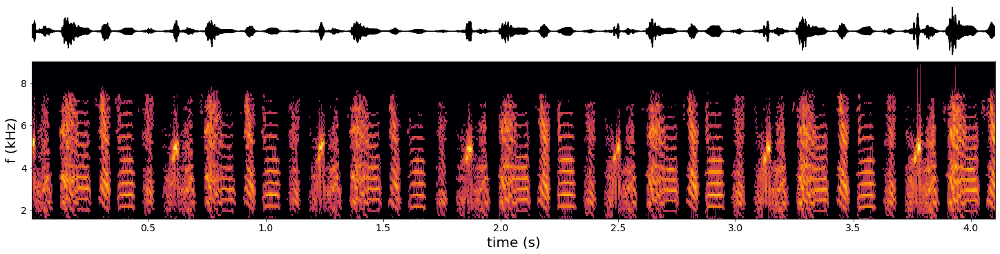

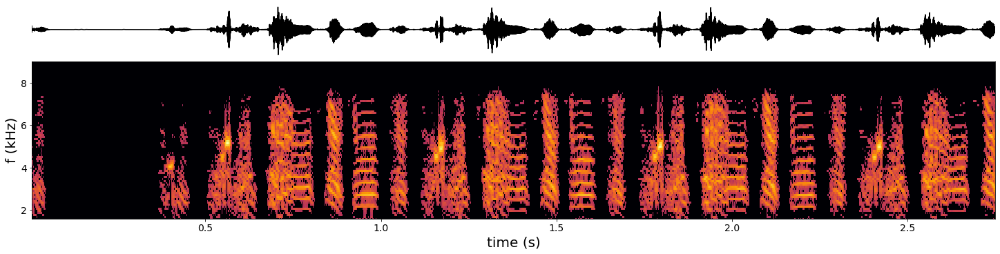

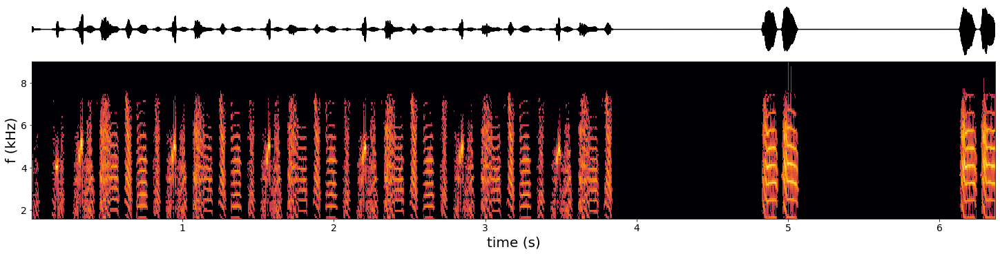

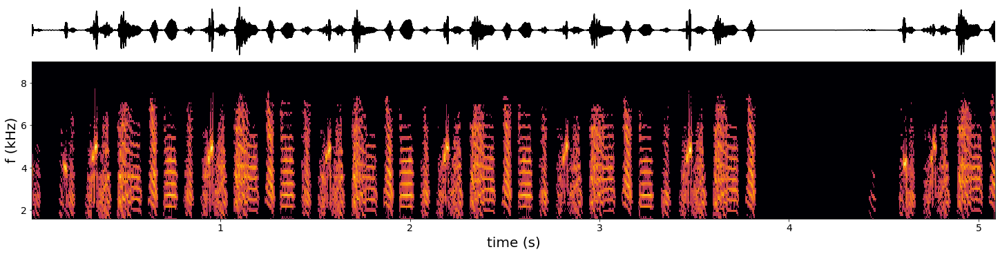

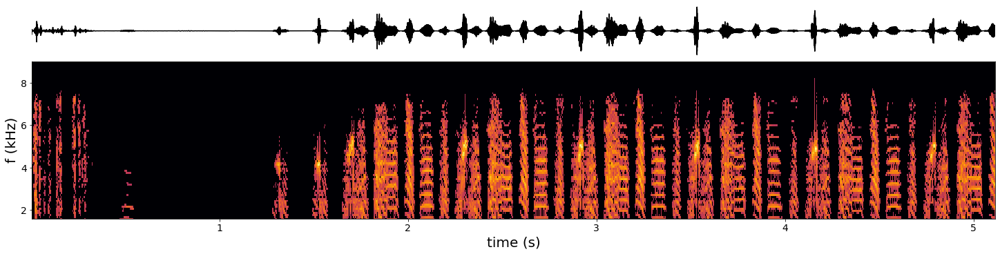

...

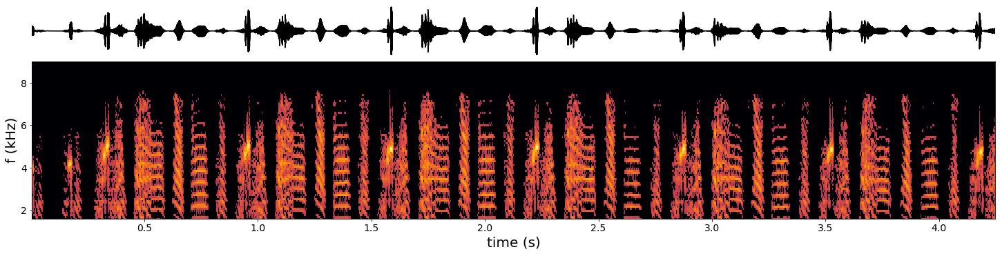

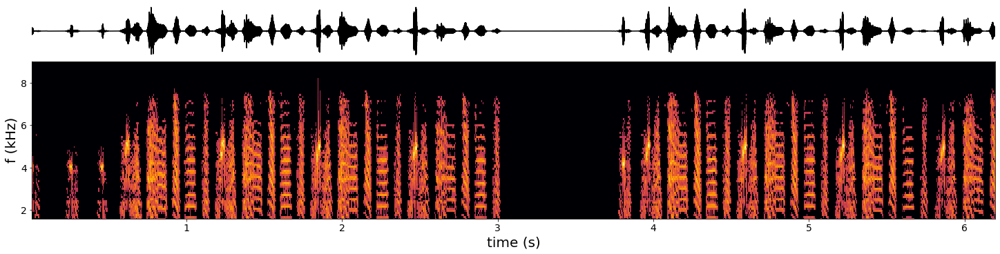

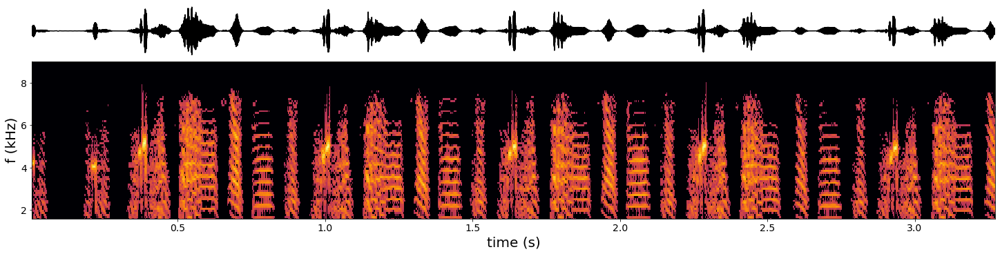

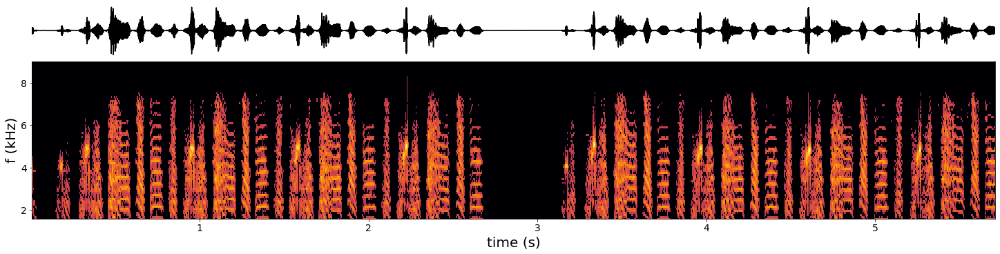

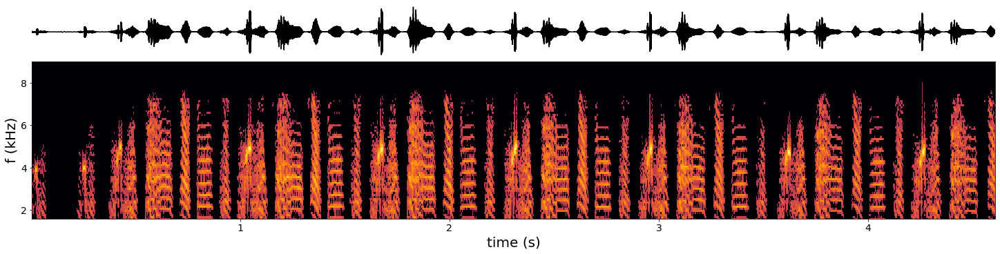

In [8]:
b, a = load_filter_coefficients('/mnt/cube/lo/filters/butter_bp_250Hz-8000hz_order4_sr25000.mat')

for wav_file in wavfiles:
    fs, mic_arr = wavfile.read(os.path.join(filepath,wav_file))
    # Lowpass filter
    b, a = butter_filt(fs, highcut = 1600, btype='high')
    mic_arr_hp = noncausal_filter(mic_arr, b, a)
    
    # Tim Sainburg noise reduce (data not noisy enough for this)
    mic_arr_nr = nr.reduce_noise(mic_arr,fs, n_std_thresh_stationary=0.5)

    f, t, sxx = sp.ms_spectrogram(mic_arr_hp.flatten(), fs)
    
    # Plot audio data
    fig, ax = plt.subplots(nrows=2, gridspec_kw={'height_ratios': [1,3]}, figsize=(20, 5), constrained_layout=True)
    
    # SONOGRAM
    ax[0].plot(mic_arr_nr.flatten(), 'black')
    ax[0].set_xlim([0, len(mic_arr_nr.flatten())])
    ax[0].set_axis_off()

    # SPECTROGRAM
    ax[1].pcolormesh(t, f, np.log(sxx), cmap='inferno')
    ax[1].set_xlim([t[0], t[-1]])
    ax[1].set_xlabel('time (s)', fontsize=20)
    ax[1].tick_params(axis='x', labelsize=14)
    ax[1].set_ylabel('f (kHz)', fontsize=20)
    ax[1].set_yticks([0,2000, 4000, 6000, 8000])
    ax[1].set_yticklabels(['0', '2', '4', '6', '8'], fontsize=14)
    ax[1].set_ylim([1600, 9000]);

In [10]:
first_file = os.path.join(filepath,wavfiles[0])
fs, mic_arr = wavfile.read(first_file)

bout_df = pd.DataFrame([[mic_arr, fs]], columns=['mic_arr', 's_f'])

for wav_file in wavfiles[1:]:
    fs, mic_arr = wavfile.read(os.path.join(filepath,wav_file))
    bout_df.loc[len(bout_df.index)] = [mic_arr, fs]

In [35]:
pad_len = round(fs/2)

In [11]:
bout_df['bout_idx'] = bout_df.index
bout_df['bout_len_s'] = bout_df['mic_arr'].apply(lambda x: len(x)) / fs
bout_df['mic_arr_pad'] = bout_df['mic_arr'].apply(lambda x: np.pad(x, (pad_len, pad_len), "constant", constant_values=0))
bout_df.head(3)

,mic_arr,s_f,bout_idx,bout_len_s,mic_arr_pad
0,"[4717, 3517, 1010, -1899, -4158, -4965, -4094,...",48000,0,4.110604,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,"[6453, 7154, 6352, 4184, 1192, -1911, -4475, -...",48000,1,2.755667,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,"[5410, 4207, 1958, -746, -3226, -4866, -5281, ...",48000,2,6.375479,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


### Segment each bout

In [29]:
min_level_db = -100 ## default dB minimum of spectrogram (threshold anything below)
min_level_db_floor = -40 ## highest number min_level_db is allowed to reach dynamically
db_delta = 5 ## delta in setting min_level_db
n_fft = 512 ## FFT window size
hop_length_ms = 1 ## number audio of frames in ms between STFT columns
win_length_ms = 4 ## size of fft window (ms)
ref_level_db = 20 ## reference level dB of audio
pre = 0.97 ## coefficient for preemphasis filter
spectrogram_range = None ## spectral range to care about for spectrogram
verbose = True ## display output
mask_thresh_std = 0.8 ## standard deviations above median to threshold out noise (higher = threshold more noise)
neighborhood_time_ms = 50 ## size in time of neighborhood-continuity filter
neighborhood_freq_hz = 500 ## size in Hz of neighborhood-continuity filter
neighborhood_thresh = 0.75 ## threshold number of neighborhood time-frequency bins above 0 to consider a bin not noise
min_syllable_length_s = 0.05 ## shortest expected length of syllable
min_silence_for_spec = 0.01 ## shortest expected length of silence in a song (used to set dynamic threshold)
silence_threshold = 0.05 ## threshold for spectrogram to consider noise as silence
max_vocal_for_spec = 2.0 ## longest expected vocalization in seconds
temporal_neighbor_merge_distance_ms = 50 ## longest distance at which two elements should be considered one
overlapping_element_merge_thresh = np.inf ## proportion of temporal overlap to consider two elements one
min_element_size_ms_hz = [0,0] ## smallest expected element size (in ms and Hz). Everything smaller is removed
butter_min = 500
butter_max = 7500
figsize = (20,5)

longest silence 0.5310000000000006
longest vocalization 0.1509999999999999


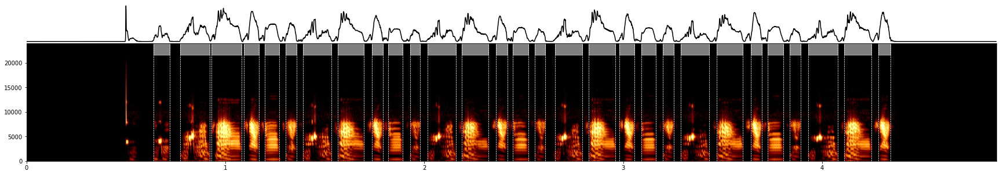

(0.09627586206896543, 0.03816199278368928)

In [34]:
def segment_bout(x_int: np.array, fs, plot: bool=True) -> dict:
    x = x_int.astype(float)/np.max(np.abs(x_int))
    
    #x = int16_to_float32(x_int)
    
    x = butter_bandpass_filter(x, butter_min, butter_max, fs)
    
    x_segmented = dynamic_threshold_segmentation(x, fs,
        n_fft=n_fft,
        hop_length_ms=hop_length_ms,
        win_length_ms=win_length_ms,
        min_level_db_floor=min_level_db_floor,
        db_delta=db_delta,
        ref_level_db=ref_level_db,
        pre=pre,
        max_vocal_for_spec=max_vocal_for_spec,
        min_level_db=min_level_db,
        silence_threshold=silence_threshold,
        verbose=True,
        min_syllable_length_s=min_syllable_length_s,
    )
    
    if plot and x_segmented:
        plot_segmentations(
            x_segmented["spec"],
            x_segmented["vocal_envelope"],
            x_segmented["onsets"],
            x_segmented["offsets"],
            hop_length_ms,
            fs,
        )
        plt.show()
    return x_segmented['onsets'], x_segmented['offsets']
    ## Add below:
    ## x_segmented['onsets'] = x_segmented['onsets'] - (pad_len / fs)
    ## x_segmented['offsets'] = x_segmented['offsets'] - (pad_len / fs)


# Demonstrating why cropping calls out of the bout helps!
x = nr.reduce_noise(bout_df.iloc[2]['mic_arr_pad'].flatten(),fs)
x = x[:-round(fs*2.5)]

on, off = segment_bout(x, fs)
np.mean(off - on),np.std(on-off)

In [14]:
x_segmented

{'spec': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 'vocal_envelope': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 'min_level_db': -100,
 'onsets': array([0.498, 0.632, 0.772, 1.28 , 1.386, 1.711, 1.923, 2.011, 2.169,
        2.337, 2.552, 2.646, 2.802, 2.974, 3.087, 3.195, 3.285, 3.449,
        3.614, 3.833, 3.925, 4.091, 4.258, 5.315, 5.441, 6.627]),
 'offsets': array([0.559, 0.724, 1.276, 1.363, 1.704, 1.896, 1.983, 2.164, 2.331,
        2.529, 2.613, 2.8  , 2.969, 3.084, 3.169, 3.259, 3.44 , 3.611,
        3.807, 3.895, 4.084, 4.255, 4.358, 5.439, 5.573, 6.879])}

# Building the widget!

In [ ]:
def segment_series(ds: pd.Series) -> dict:
    on_sec,  off_sec = segment_bout(nr.reduce_noise(ds['mic_arr'].flatten(),fs), fs, plot=False)
    on = (on_sec * fs).astype(int)
    off = (off_sec * fs).astype(int)
    return on, off

seg_ser_dict = segment_series(bout_df.iloc[3])
seg_ser_dict

In [ ]:
tqdm.pandas()

# segment all bouts
bout_df[['s_on', 's_off']] = bout_df.progress_apply(segment_series, axis=1, result_type='expand')

onset_sec = 0.1 #100ms preceding each syllable
bout_df['s_on'] = bout_df['s_on'] - int(onset_sec*fs)

bout_df['ms_on'] = bout_df['s_on'] * 1000
bout_df['ms_off'] = bout_df['s_off'] * 1000

In [120]:
# get the spectrograms for all syllables
def get_syl_df(ds: pd.Series, spk=False) -> pd.DataFrame:
    syl_idx = ['{}-{}'.format(ds['bout_idx'], i) for i in range(ds['s_on'].size)]
    syl_x = [ds['mic_arr'][int(on): int(off)] for on, off in zip(ds['s_on'], ds['s_off'])]
    
    syl_df = pd.DataFrame({'syl_idx': syl_idx,
                           'mic_arr': syl_x,
                           's_on': ds['s_on'],
                           'bout_idx': ds['bout_idx']})
    return syl_df

sdf = get_syl_df(bout_df.iloc[3])
sdf

,syl_idx,mic_arr,s_on,bout_idx
0,3-0,[],-4800,3
1,3-1,"[-1241, -2562, -3766, -4411, -3953, -2104, 860...",16608,3
2,3-2,"[-32, -37, -58, -84, -103, -110, -106, -94, -8...",21120,3
3,3-3,"[1330, 1714, 1753, 1608, 1422, 1273, 1162, 945...",34944,3
4,3-4,"[1826, 1610, 333, -1492, -3007, -3469, -2527, ...",58944,3
5,3-5,"[-342, -558, -516, -363, -299, -398, -540, -52...",64272,3
6,3-6,"[-155, -152, -152, -157, -163, -168, -168, -16...",68640,3
7,3-7,"[7341, 5850, 3752, 1440, -832, -2868, -4449, -...",78048,3
8,3-8,"[306, 2482, 5675, 9069, 11173, 10661, 7007, 10...",103008,3
9,3-9,"[61, 63, 67, 74, 82, 87, 87, 82, 74, 69, 71, 8...",107520,3


In [118]:
syl_df = pd.concat([get_syl_df(ds) for i, ds in bout_df.iterrows()], axis=0)
syl_df.reset_index(inplace=True, drop=True)

In [121]:
syl_df.head(3)

,syl_idx,mic_arr,s_on,bout_idx
0,0-0,[],-4800,0
1,0-1,"[-128, -130, -131, -129, -125, -120, -117, -11...",20352,0
2,0-2,"[-14, -27, -36, -36, -27, -14, -5, -2, -3, -5,...",24720,0


In [122]:
# some syllables start right near the edge, and with the onset_sec parameter can start in negative indexes. 
# for now, just get rid of those
syl_df = syl_df[syl_df['s_on']>0]
syl_df.reset_index(inplace=True, drop=True)

### Generate spectrograms

In [127]:
# set hyperparameters
if species == 'starling':
    hparams = HParams(
        num_mel_bins = 32,
        mel_lower_edge_hertz=500,
        mel_upper_edge_hertz=10000,
        butter_lowcut = 500,
        butter_highcut = 20000,
        ref_level_db = 20,
        min_level_db = -45,
        mask_spec = True,
        win_length_ms = 10,
        hop_length_ms = 1,
        nex=-1,
        n_jobs=-1,
        verbosity = 0,
    )
elif species == 'zebra_finch': ## these need to be tested
    hparams = HParams(
        num_mel_bins = 32,
        mel_lower_edge_hertz=500,
        mel_upper_edge_hertz=12000,
        butter_lowcut = 500,
        butter_highcut = 12000,
        ref_level_db = 20,
        min_level_db = -100,
        mask_spec = True,
        win_length_ms = 4,
        hop_length_ms = 1,
        nex = -1,
        n_jobs = -1,
        verbosity = 0,
    )
else:
    hparams = HParams(
        num_mel_bins = 32,
        mel_lower_edge_hertz=500,
        mel_upper_edge_hertz=20000,
        butter_lowcut = 500,
        butter_highcut = 20000,
        ref_level_db = 20,
        min_level_db = -45,
        mask_spec = True,
        win_length_ms = 10,
        hop_length_ms = 1,
        nex=-1,
        n_jobs=-1,
        verbosity = 0,
    )

mel_matrix = prepare_mel_matrix(hparams, fs)

In [129]:
# make spectrograms
syl_df['spec'] = syl_df['mic_arr'].progress_apply(lambda x: make_spec(x/32768, fs, 
                                                                 hparams=hparams,
                                                                 mel_matrix=mel_matrix,
                                                                 use_mel=True,
                                                                 use_tensorflow=False))

100%|██████████| 309/309 [00:05<00:00, 60.65it/s]


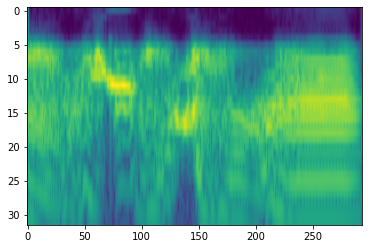

In [132]:
# example syllable for visualization
i_syl = 5
plt.imshow(syl_df.iloc[i_syl]['spec'][::-1], aspect='auto')

### Pad spectrogams

In [133]:
all_syl_len = [s.shape[-1] for s in syl_df['spec']]
pad_len = np.max(all_syl_len)

syl_df['spec_pad'] = syl_df['spec'].apply(lambda x: pad_spectrogram(x, pad_len))

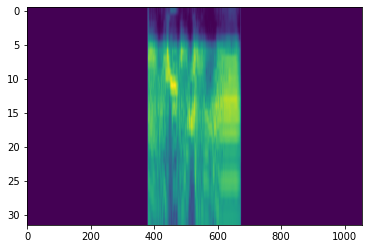

In [134]:
# plot padded syllable
plt.imshow(syl_df.iloc[i_syl]['spec_pad'][::-1], aspect='auto')

In [27]:
# spk_pad_len = np.max(list(map(lambda x: x.shape[-1], syl_df['spk_ms_arr'])))
# spk_pad_len

# syl_df['spk_pad'] = syl_df['spk_ms_arr'].apply(lambda x: pad_spectrogram(x, spk_pad_len))

In [28]:
#spk_pad = pad_spectrogram(syl_df.iloc[i_syl]['spk_ms_arr'], spk_pad_len)

In [135]:
syl_df['spec_pad'] = syl_df['spec_pad'].apply(lambda x: (norm(x)*255).astype('uint8'))

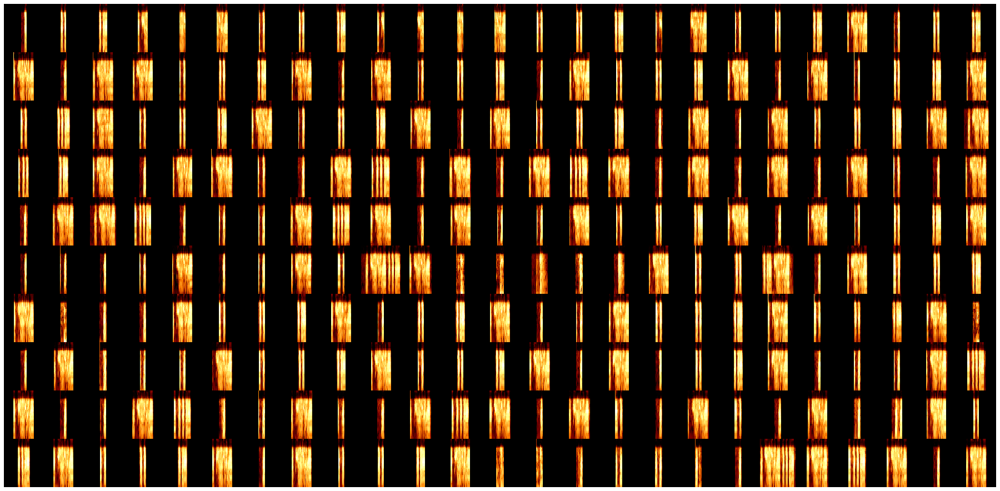

In [136]:
fig, ax = plt.subplots(figsize=(32, 16))

draw_spec_set(list(syl_df['spec_pad']), zoom=20, maxrows=10, colsize=25, ax=ax)

#### Can see that a low of syllables are being lumped into the same segmentation -- I think this could be partially fixed by trimming bouts to precise start/stop point manually, but will probably also need a manual syllable segmentation check after the automated step

## Cluster spectrograms with hdbscan
Get umap embeddings of all padded syllables

In [137]:
embedding = umap.UMAP(min_dist = 0.5, verbose = True)

specs_flattened = flatten_spectrograms(list(syl_df['spec_pad']))
specs_umap = list(embedding.fit_transform(specs_flattened))
syl_df['umap'] = specs_umap

UMAP(min_dist=0.5, verbose=True)
Sun Aug 27 21:50:32 2023 Construct fuzzy simplicial set
Sun Aug 27 21:50:33 2023 Finding Nearest Neighbors
Sun Aug 27 21:50:36 2023 Finished Nearest Neighbor Search
Sun Aug 27 21:50:39 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Aug 27 21:50:42 2023 Finished embedding


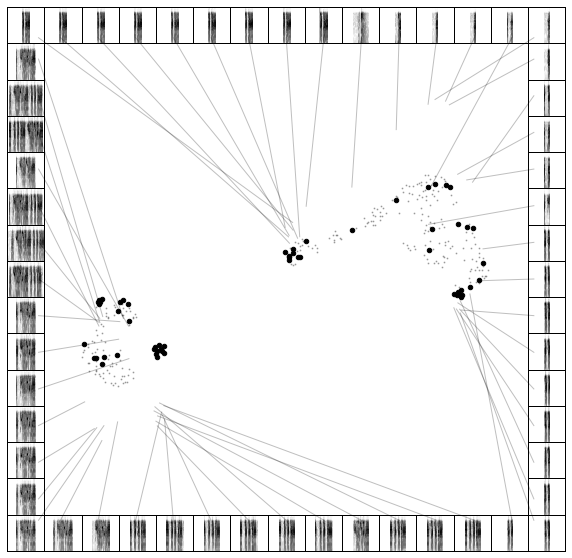

In [138]:
scatter_spec(
        np.vstack(syl_df['umap']),
        list(syl_df['spec_pad']),
        column_size=15,
        #x_range = [-5.5,7],
        #y_range = [-10,10],
        pal_color="hls",
        color_points=False,
        enlarge_points=20,
        figsize=(10, 10),
        scatter_kwargs = {
            #'labels': list(indv_df.phrase.values),
            'alpha':0.25,
            's': 1,
            'show_legend': False
        },
        matshow_kwargs = {
            'cmap': plt.cm.Greys
        },
        line_kwargs = {
            'lw':1,
            'ls':"solid",
            'alpha':0.25,
        },
        draw_lines=True
    );

plt.show()

cluster all padded

In [150]:
umap_arr = np.vstack(list(syl_df['umap']))

min_cluster_size = round(int(len(umap_arr) * 0.002)) # 0.002
if min_cluster_size < 2: min_cluster_size = 2
print(min_cluster_size)

2


In [151]:
clusterer = hdbscan.HDBSCAN(min_cluster_size = min_cluster_size).fit(umap_arr)

syl_df['hdbscan_labels'] = list(clusterer.labels_)

/mnt/cube/lo/envs/avgn_paper/avgn/visualization/projections.py:76: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  colors = np.array([lab_dict[i] for i in labels])


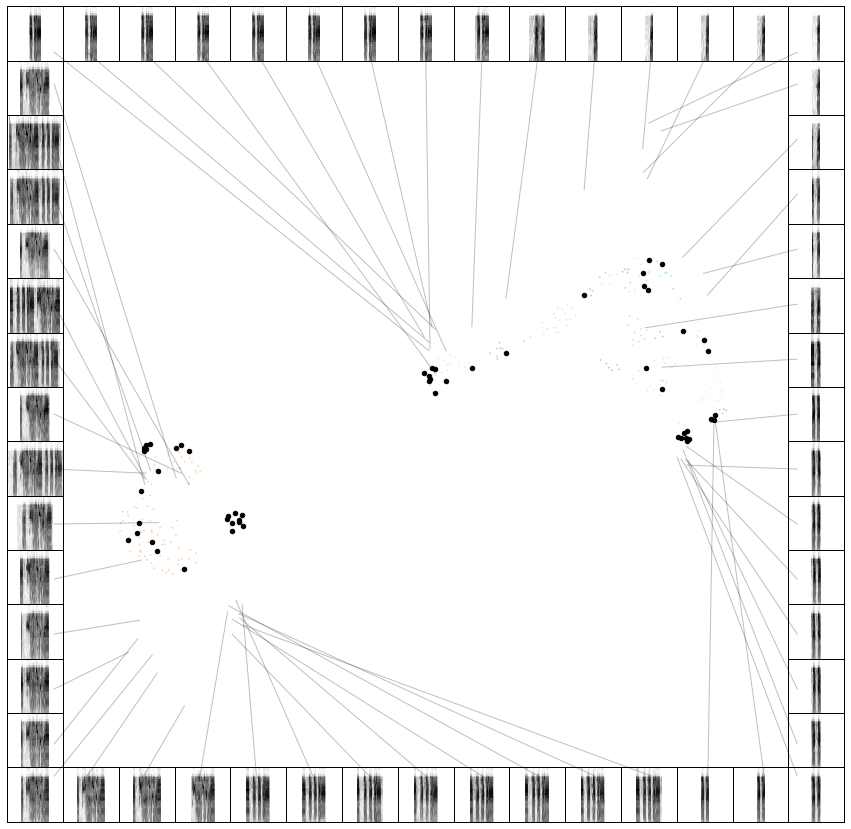

In [152]:
scatter_spec(
        umap_arr,
        list(syl_df['spec_pad']),
        column_size=15,
        #x_range = [-5.5,7],
        #y_range = [-10,10],
        pal_color="hls",
        color_points=False,
        enlarge_points=20,
        figsize=(15, 15),
        scatter_kwargs = {
            'labels': list(syl_df.hdbscan_labels.values),
            'alpha':0.25,
            's': 1,
            'show_legend': False
        },
        matshow_kwargs = {
            'cmap': plt.cm.Greys
        },
        line_kwargs = {
            'lw':1,
            'ls':"solid",
            'alpha':0.25,
        },
        draw_lines=True
    );
plt.show()

In [153]:
syl_df.head(1)

,syl_idx,mic_arr,s_on,bout_idx,spec,spec_pad,umap,hdbscan_labels
0,0-1,"[-128, -130, -131, -129, -125, -120, -117, -11...",20352,0,"[[0.29845253915839975, 0.2991449201283393, 0.2...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[19.181803, 9.427036]",17


In [154]:
np.unique(syl_df['hdbscan_labels'])

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28])

In [155]:
syl_sel = (syl_df['hdbscan_labels']==11)
np.sum(syl_sel==True)

2

### Save outputs

In [18]:
# syl_df_file = output_path + 'syl_clust_df.pkl'
# syl_df_file

In [44]:
# with open(syl_df_file, 'wb') as f:
#     pickle.dump(syl_df, f)

In [45]:
# with open(syl_df_file, 'rb') as f:
#     syl_df = pickle.load(f) 